### Clustering using scientific publications data

Authors: Jose Rodrigo Flores Espinosa & Marta Napa  
email: rodrigo.flores@ut.ee & marta.napa@ut.ee

### Objective

The goal of this project is to cluster the scientific publications in the dataset. For this at least the abstract and the title of the paper have to be used.  
Then, a simple search engine on top of that which recommends similar papers based on search by title should be produced  

- Can clustering similar research articles together simplify the search for related publications?

- How can the content of the clusters be qualified?

- Over each cluster how can we recommend the most similar papers leveraging clustering?

### Dataset

Data set The source of the data is [https://www.aminer.org/citation](https://www.aminer.org/citation), version 13 as it is the most detailed one in JSON format.

### Overview  

- Library loading
- Spark session configuration
- Load required libraries
- Load of previosly generated Delta tables into Databricks
- Exploratory data analysis
- Data sampling (novel sample)
- Pipeline initialization
  - Text pre-processing
    - UDFs-based filtering and cleaning
    - Custom transformers (vectorization of keywords)
    - Tokenizing words
    - 'Stop' words removal
    - Categorical variables to integer
  - Feature Engineering
    - Word2vec
    - TF-IDF
    - Standardization
  - Clustering
    - PCA
    - Elbow method
    - K-means
  - Search Engine

### Libraries

In [ ]:
%sh 

# installing libraries
pip install simplified_scrapy unidecode contractions word2number spacy==3.0 pydantic>=1.8.1 --quiet --disable-pip-version-check

# pip install "https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.3.1/en_core_web_md-2.3.1.tar.gz" --quiet --disable-pip-version-check
# pip install "https://github.com/explosion/spacy-models/releases/download/en_core_web_md-2.2.5/en_core_web_md-2.2.5.tar.gz" --quiet --disable-pip-version-check
pip install "https://github.com/explosion/spacy-models/releases/download/en_core_web_md-3.0.0/en_core_web_md-3.0.0.tar.gz" --quiet --disable-pip-version-check


In [ ]:
# dbutils.library.installPyPI("spacy")
# dbutils.library.restartPython()

In [ ]:
# libraries

import pyspark.sql.functions as F
from pyspark.sql.types import *
from pyspark.conf import SparkConf
from pyspark.context import SparkContext

from pyspark.ml.feature import Tokenizer
from pyspark.ml.feature import StopWordsRemover
from pyspark.ml.feature import RegexTokenizer
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import Word2Vec
from pyspark.ml.feature import HashingTF, IDF, Tokenizer
from pyspark.ml.feature import StandardScaler
from pyspark.ml.feature import PCA
from pyspark.ml import Pipeline

from pyspark.ml.linalg import Vectors, VectorUDT
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

import pylab as pl

from simplified_scrapy.simplified_doc import SimplifiedDoc 
from unidecode import unidecode
import contractions
from word2number import w2n
import spacy
nlp = spacy.load("en_core_web_md")

from IPython.display import Image 
from IPython.core.display import HTML 

import numpy as np
import pandas as pd

from string import ascii_letters, punctuation
import urllib 
import json
import re
import os, sys

In [ ]:
%sh

# https://github.com/explosion/spaCy/issues/7453
# https://github.com/explosion/spacy-models/blob/master/compatibility.json
python -m spacy validate


⠙ Loading compatibility table...
✔ Loaded compatibility table

================= Installed pipeline packages (spaCy v3.0.0) =================
ℹ spaCy installation:
/databricks/python3/lib/python3.8/site-packages/spacy

NAME             SPACY            VERSION                            
en_core_web_md   >=3.0.0,<3.1.0   3.0.0   ✔
en_core_web_sm   >=3.0.0,<3.1.0   3.0.0   ✔



### Spark Session

- General information of Spark session is visualized
- Spark configuration tuning
  - Number of partitions is set to the value of 'defaultParallelism'

In [ ]:
conf = SparkConf()
display(conf.getAll())

_1 _2 spark.executor.memory 8278m spark.ui.port 40001 spark.executor.extraClassPath /databricks/spark/dbconf/log4j/executor:/databricks/spark/dbconf/jets3t/:/databricks/spark/dbconf/hadoop:/databricks/hive/conf:/databricks/jars/----com_google_protobuf--timestamp_proto-spark_3.2_2.12-scalabp.jar:/databricks/jars/----glue-catalog-spark3.2-client--glue-catalog-client-common_deploy.jar:/databricks/jars/----glue-catalog-spark3.2-client--glue-catalog-hive2-client_deploy.jar:/databricks/jars/----glue-catalog-spark3.2-client--glue-catalog-shim-common_deploy.jar:/databricks/jars/----glue-catalog-spark3.2-client--glue-catalog-shim-hive1_deploy.jar:/databricks/jars/----glue-catalog-spark3.2-client--glue-catalog-shim-hive2_deploy.jar:/databricks/jars/----glue-catalog-spark3.2-client--glue-catalog-shim-loader_deploy.jar:/databricks/jars/----jackson_annotations_shaded--libjackson-annotations.jar:/databricks/jars/----jackson_core_shaded--libjackson-core.jar:/databricks/jars/----jackson_databind_shaded--libjackson-databind.jar:/databricks/jars/----jackson_datatype_joda_shaded--libjackson-datatype-joda.jar:/databricks/jars/----scalapb_090--com.lihaoyi__fastparse_2.12__2.1.3_shaded.jar:/databricks/jars/----scalapb_090--com.lihaoyi__sourcecode_2.12__0.1.7_shaded.jar:/databricks/jars/----scalapb_090--runtime-unshaded-jetty9-hadoop1_2.12_deploy_shaded.jar:/databricks/jars/----workspace_spark_3_2--common--kvstore--kvstore-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--common--network-common--network-common-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--common--network-shuffle--network-shuffle-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--common--sketch--sketch-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--common--tags--tags-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--common--unsafe--unsafe-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--core--core-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--core--libcore_generated_resources.jar:/databricks/jars/----workspace_spark_3_2--core--libcore_resources.jar:/databricks/jars/----workspace_spark_3_2--core--proto-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--graphx--graphx-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--launcher--launcher-hive-2.3__hadoop-3.2_2.12_deploy.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--antlr--antlr--antlr__antlr__2.7.7.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--amazon-kinesis-client--com.amazonaws__amazon-kinesis-client__1.12.0.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--aws-java-sdk-autoscaling--com.amazonaws__aws-java-sdk-autoscaling__1.12.189.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--aws-java-sdk-cloudformation--com.amazonaws__aws-java-sdk-cloudformation__1.12.189.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--aws-java-sdk-cloudfront--com.amazonaws__aws-java-sdk-cloudfront__1.12.189.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--aws-java-sdk-cloudhsm--com.amazonaws__aws-java-sdk-cloudhsm__1.12.189.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--aws-java-sdk-cloudsearch--com.amazonaws__aws-java-sdk-cloudsearch__1.12.189.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--aws-java-sdk-cloudtrail--com.amazonaws__aws-java-sdk-cloudtrail__1.12.189.jar:/databricks/jars/----workspace_spark_3_2--maven-trees--hive-2.3__hadoop-3.2--com.amazonaws--aws-java-sdk-cloudwatch--com.amazonaws__aws-java-sdk-cloudwatch__1.12.189.jar

#### Spark Configuration

In [ ]:
# partitions
# spark.conf.set("spark.sql.shuffle.partitions", sc.defaultParallelism) # reduce parallelism for aggregations and joins, set it to amount of cores. Faster processing
spark.conf.set("spark.sql.shuffle.partitions", 4)

In [ ]:
# spark.conf.get('spark.sql.files.maxPartitionBytes')
spark.conf.get('spark.sql.shuffle.partitions')


Out[4]: '4'

In [ ]:
%sh

ls -lh /mnt/

total 8.0K
drwxr-xr-x 2 root root 4.0K May 27 07:02 driver-daemon
drwxr-xr-x 2 root root 4.0K May 27 07:01 readonly


In [ ]:
# local variables

local_path = '/mnt/'

### Data loading

- Data persisted and stored in Delta tables from project "Data Warehouse" is used as starting data
- Data is initially scattered across 22 Delta tables but the first step is a join operation for all
  - This results on a table with 3 Million+ rows

In [ ]:
# https://stackoverflow.com/questions/11150239/natural-sorting
def natural_sort(l): 
    convert = lambda text: int(text) if text.isdigit() else text.lower() 
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)] 
    return sorted(l, key=alphanum_key)

# concatenate delta tables in the form of Spark dataframes
def delta_concat(df_tgt, src_table_file, table_format):
    tmp_tbl = spark.sql("SELECT * FROM {}.`{}`".format(table_format, src_table_file))
    df_tgt = df_tgt.union(tmp_tbl)
    del tmp_tbl
    return df_tgt


In [ ]:
# fetches all delta table file names/paths present in DBFS

d = dbutils.fs.ls("/user/hive/warehouse/")
dblpv13_delta_parts = []

for l in d:
    file = str(l).split()[0]
    if 'dblpv13_edited_parsed_part' in file:
        dblpv13_delta_parts.append((file.replace("FileInfo(path='dbfs:", "").replace("/',", "")))

dblpv13_delta_parts = (natural_sort(dblpv13_delta_parts))
print("There are {} Delta tables present at /user/hive/warehouse/\n".format(len(dblpv13_delta_parts)))
print(dblpv13_delta_parts)

There are 22 Delta tables present at /user/hive/warehouse/

['/user/hive/warehouse/dblpv13_edited_parsed_part_1', '/user/hive/warehouse/dblpv13_edited_parsed_part_2', '/user/hive/warehouse/dblpv13_edited_parsed_part_3', '/user/hive/warehouse/dblpv13_edited_parsed_part_4', '/user/hive/warehouse/dblpv13_edited_parsed_part_5', '/user/hive/warehouse/dblpv13_edited_parsed_part_6', '/user/hive/warehouse/dblpv13_edited_parsed_part_7', '/user/hive/warehouse/dblpv13_edited_parsed_part_8', '/user/hive/warehouse/dblpv13_edited_parsed_part_9', '/user/hive/warehouse/dblpv13_edited_parsed_part_10', '/user/hive/warehouse/dblpv13_edited_parsed_part_11', '/user/hive/warehouse/dblpv13_edited_parsed_part_12', '/user/hive/warehouse/dblpv13_edited_parsed_part_13', '/user/hive/warehouse/dblpv13_edited_parsed_part_14', '/user/hive/warehouse/dblpv13_edited_parsed_part_15', '/user/hive/warehouse/dblpv13_edited_parsed_part_16', '/user/hive/warehouse/dblpv13_edited_parsed_part_17', '/user/hive/warehouse/dblpv13_

In [ ]:
# table_format="parquet"
table_format="delta"

# seeding table
df = spark.sql("SELECT * FROM {}.`{}`".format(table_format, dblpv13_delta_parts[0]))

# joins iteratively all the rest of the 21 delta tables 
for src_table_file in dblpv13_delta_parts[1:]:
    df = delta_concat(df, src_table_file, table_format)

# df = (df.replace('NA', None))

### Data Exploration

- The structure and column data types are alreasy well-known from the previous projects
- General operations that one would use for data exploration are shown

In [ ]:
print(type(df))
display(f"Rows: {df.count():,}") 
# print("\nPartitions ", df.rdd.getNumPartitions(), "\n")
display(df.printSchema())
display(df)


<class 'pyspark.sql.dataframe.DataFrame'>
'Rows: 3,412,036'root
 |-- id: string (nullable = true)
 |-- title: string (nullable = true)
 |-- authors: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- name: string (nullable = true)
 |    |    |-- org: string (nullable = true)
 |-- doc_type: string (nullable = true)
 |-- n_citation: integer (nullable = true)
 |-- issn: string (nullable = true)
 |-- isbn: string (nullable = true)
 |-- doi: string (nullable = true)
 |-- volume: string (nullable = true)
 |-- year: integer (nullable = true)
 |-- venue: struct (nullable = true)
 |    |-- name: string (nullable = true)
 |    |-- type: string (nullable = true)
 |    |-- raw: string (nullable = true)
 |-- lang: string (nullable = true)
 |-- fos_general: string (nullable = true)
 |-- fos_specific: string (nullable = true)
 |-- keywords: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- abstract: string (nullable = true)



id,title,authors,doc_type,n_citation,issn,isbn,doi,volume,year,venue,lang,fos_general,fos_specific,keywords,abstract
53e99784b7602d9701f3e151,A solution to the problem of touching and broken characters,"List(List(Jairo Rocha, NA), List(Theo Pavlidis, NA))",conference,17,NA,NA,10.1109/ICDAR.1993.395663,NA,1993,"List(International Conference on Document Analysis and Recognition, 0, ICDAR-)",en,natural sciences,computer sciences,"List(handwriting recognition, prototypes, image segmentation, computer science, expert systems, knowledge base, pattern recognition, usability, optical character recognition, shape, feature extraction)",NA
53e99784b7602d9701f3e15d,Timing yield estimation using statistical static timing analysis,"List(List(Min Pan, NA), List(Chris C. N. Chu, NA), List(Hai Zhou, NA))",book,28,NA,0-7803-8834-8,10.1109/ISCAS.2005.1465124,NA,2005,"List(International Symposium on Circuits and Systems, 0, ISCAS)",en,NA,NA,"List(sequential circuits, statistical distributions, set-up time constraints, register-to-register paths, statistical static timing analysis, integrated circuit modelling, parameter estimation, statistical analysis, circuit model, path delays, deep sub-micron technology, timing, delay distributions, delays, circuit timing, shortest path variations, hold time constraints, integrated circuit yield, process variations, integrated circuit layout, high-performance circuit designs, clock skew, timing yield estimation, deterministic static timing analysis, monte carlo simulation, design method, static timing analysis, design methodology, process variation, shortest path, registers, circuit design, circuit analysis)","As process variations become a significant problem in deep sub-micron technology, a shift from deterministic static timing analysis to statistical static timing analysis for high-performance circuit designs could reduce the excessive conservatism that is built into current timing design methods. We address the timing yield problem for sequential circuits and propose a statistical approach to handle it. We consider the spatial and path reconvergence correlations between path delays, set-up time and hold time constraints, and clock skew due to process variations. We propose a method to get the timing yield based on the delay distributions of register-to-register paths in the circuit On average, the timing yield results obtained by our approach have average errors of less than 1.0% in comparison with Monte Carlo simulation. Experimental results show that shortest path variations and clock skew due to process variations have considerable impact on circuit timing, which could bias the timing yield results. In addition, the correlation between longest and shortest path delays is not significant"
53e99784b7602d9701f3e922,International Conference on Nano/Micro Engineered and Molecular Systems,"List(List(Jungil Park, NA), List(Sunyoung Ahn, NA), List(Youngmi Kim Pak, NA), List(James Jungho Pak, NA))",conference,1,NA,NA,10.1109/NEMS.2009.5068754,NA,2009,"List(NA, NA, NEMS)",en,NA,NA,List(NA),NA
53e99784b7602d9701f3f411,Using XML to Integrate Existing Software Systems into the Web,"List(List(Harry M. Sneed, NA))",book,28,NA,0-7695-1727-7,10.1109/CMPSAC.2002.1044548,NA,2002,"List(Computer Software and Applications Conference, 0, COMPSAC)",en,natural sciences,computer sciences,"List(internet, hypermedia markup languages, information resources, systems re-engineering, cobol, pl/i, world wide web, xml, batch programs, data conversion, e-commerce, extensible markup language, enterprise application integration, interface reengineering, legacy programs, online programs, software reengineering, subprograms, systems integration)","The eXtensible Markup Language 驴 XML 驴 is not only a language for communication between humans and the web, it is also a language for communication between programs. Rather than passing parameters, programs can pass documents from one to another, containing not only pure data, but control informa

In [ ]:
df.show(n=3, truncate=False, vertical=True)

-RECORD 0-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
df.describe().toPandas()

,summary,id,title,doc_type,n_citation,issn,isbn,doi,volume,year,lang,fos_general,fos_specific,abstract
0,count,3412036,3412036,3412036,3412036,1439747,635434,2715551,0,3412036,3354362,2288411,1843301,2741418
1,mean,Infinity,None,None,33.074995105561605,None,1.403516579288415E12,10.12848620689656,None,2007.7436896914335,None,None,None,2.2668298933333334E7
2,stddev,NaN,None,None,253.08329156845036,None,3.426522232353835E12,0.08209885496781426,None,22.8511956340556,None,None,None,1.3226551810008092E7
3,min,53a7258520f7420be8b514a9,\n H−∕H∞ fault detection observer in f...,book,1,0001-0782,-159593-125-2,10.0000/anziamj.v42i0.605,None,0,en,agricultural sciences,agricultural biotechnology,
4,max,607d13e89e795e3c388819cf,"👍 as social support: Relational closeness, aut...",workshop,109033,9944-4585,O-8186-8274-4,10.9876/sim.v9i1.152,None,9737,en,support activities,veterinary sciences,������������� ��������� ������������� ��������...


In [ ]:
#https://www.analyticsvidhya.com/blog/2019/11/build-machine-learning-pipelines-pyspark/
data_agg = df.agg(*[F.count(F.when(F.isnull(c), c)).alias(c) for c in df.columns])
display(data_agg)

id,title,authors,doc_type,n_citation,issn,isbn,doi,volume,year,venue,lang,fos_general,fos_specific,keywords,abstract
0,0,0,0,0,1972289,2776602,696485,3412036,0,0,57674,1123625,1568735,0,670618


### Data sampling

In [ ]:
novel_sample = (df
            .filter(F.col("lang") == 'en')
            .filter(F.col("title") != 'NA')
            .filter(F.col("abstract") != 'NA')
            .filter(F.col("fos_general") != 'NA')
            .filter(F.col("fos_specific") != 'NA')               
            .filter(~F.array_contains(F.col('keywords'), F.lit("NA")))
            .tail(10)
)

display(novel_sample)

id,title,authors,doc_type,n_citation,issn,isbn,doi,volume,year,venue,lang,fos_general,fos_specific,keywords,abstract
5fc9a8c59e795eb6c4d312cf,Development of Fractional Order Modeling of Voltage Source Converters,"List(List(Monika Sharma, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Bharat Singh Rajpurohit, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Samar Agnihotri, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Akshay Kumar Rathore, ncordia Univ, Dept Elect & Comp Engn, Montreal, PQ H3G 1M8, Canada))",journal,1,2169-3536,NA,10.1109/ACCESS.2020.3010068,NA,2020,"List(NA, NA, IEEE ACCESS)",en,engineering and technology,"electrical, electronic and information engineering","List(capacitors, fractional calculus, inductors, state-space methods, voltage-source converters, dstatcom, fractional calculus, real-time simulator, small-signal analysis, voltage source converter)","This paper proposes a mathematical fractional order modelling of Voltage Source Converters (VSC). Fractional behaviour helps to model and describe a real object more accurately than the integer order model. State-space equations of VSC is obtained using fractional calculus in d-q domain. The Caputo derivative method is employed to eliminate complex definitions of fractional calculus and to get approximate solution with optimal design of parameters. A detailed analysis is performed on developed mathematical fractional order model of VSC including small-signal analysis and DC analysis. The stability and time-domain transient analysis is carried out to validate the fractional order VSC for its application as Distribution STATtic COMpensator (DSTATCOM) in power distribution system, using real-time simulator. Fractional-order capacitor and inductor are designed and modelled for verification of fractional order VSC through simulations. The real-time simulation results verify the effectiveness of proposed model. It shows that fractional order model can describe the operating characteristics of VSC more accurately. The comparative performance analysis demonstrates superior transient response in case of fractional order devices as compared to integer order"
5fdc306e9e795e20130c4129,Australian ‘gayborhoods’ and ‘lesborhoods’: a new method for estimating the number and prevalence of adult gay men and lesbian women living in each Australian postcode,"List(List(Denton Callander, Spatial Epidemiology Lab, School of Medicine, Columbia University, New York, NY, USA; The Kirby Institute for Infection and Immunity in Society, University of New South Wales, Sydney, Australia), List(Julie Mooney-Somers, Sydney Medical School, University of Sydney, Sydney, Australia), List(Phillip Keen, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Rebecca Guy, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Tim Duck, w South Wales Ministry of Health, Sydney, Australia), List(Benjamin R. Bavinton, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Andrew E. Grulich, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Martin Holt, ntre for Social Research in Health, University of New South Wales, Sydney, Australia), List(Garrett Prestage, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia))",journal,4,NA,NA,10.1080/13658816.2019.1709973,NA,2020,"List(NA, NA, Int. J. Geogr. Inf. Sci)",en,social sciences,sociology,"List(lesbian, demography, geography)","Gay men and lesbian women often demonstrate unique settlement patterns, forming what have been referred to as ‘gayborhoods’. This study sought to provide the first postcode-level estimates of p

### Pipelines initialization

In [ ]:
pipeline_preprocessing = Pipeline()
stages_preprocessing = []

pipeline_feature_eng = Pipeline()
stages_feature_eng = []

pipeline_kmeans = Pipeline()
stages_kmeans = []


### Data pre-processing Pipeline

The goal is to clean and preprocess the text to prepare it to represent it in vectors.
It is a mandatory step in NLP projects to preprocess the text. You can have a look in [this article](https://towardsdatascience.com/nlp-text-preprocessing-a-practical-guide-and-template-d80874676e79) or [this one](https://www.kaggle.com/code/kmader/preprocessing-author-data/notebook) to explore some of well-known preprocessing steps and find how they can be done in Spark Mlib.  


- Retain articles in English only  
  - About 60K papers have no language category. The rest are English category ("en")  

- Several UDFs are define to perform data transformations on "abstract" and "title" columns  
  - Remove HTML code
  - Substitute accents for corresponding letter with no accent
  - Expand contractions (e.g. don't -> do not)
  - Conversion of number words to numeric form. E.g. "three" -> "3"
  - Lemmatization: Converting a word to its base form, e.g., “caring” to “care”.
  - Remove puntutation characters anywhere in the text using the regex: '[!()-[]{};:\'"\,<>./?@#$%^&*_~]'

- Tokenizing
  - title
  - abstract

- Remove stop words (abstract & title)
  - Default list 
  - Custom list

- StringIndexer
  - document type
  - fos general
  - fos specific
  
- User defined transformer
  - Keywords vectorization

#### Define UDFs

In [ ]:
#define and register udf
def remove_html(text):
    """remove html tags, e.g. <br />"""
    c_text = SimplifiedDoc(text).text
    return c_text

remove_html_udf = F.udf(lambda x:remove_html(x))   

def remove_accented_chars(text):
    """remove accented characters from text, e.g. café"""
    c_text = unidecode(text)
    return c_text

remove_accented_chars_udf = F.udf(lambda x:remove_accented_chars(x))   

def expand_contractions(text):
    """expand shortened words, e.g. don't to do not"""
    c_text = contractions.fix(text)
    return c_text

expand_contractions_udf = F.udf(lambda x:expand_contractions(x))   
                    
def word2num(text):
    """conversion of number words to numeric form"""
    doc = nlp(text)
    try:
        tokens = [w2n.word_to_num(token.text) if token.pos_ == 'NUM' else token for token in doc]
        c_text = ' '.join([str(x) for x in tokens])
    except ValueError:
        c_text = text
                
    return c_text

word2num_udf = F.udf(lambda x:word2num(x))   

def lemmatization(text):
    """converting a word to its base form, e.g., “caring” to “care”"""
    doc = nlp(text)
#     try:
    c_text = ' '.join([word.lemma_ if word.lemma_ != "-PRON-" else word.lower_ for word in doc])
#     c_text = ' '.join([str(x) for x in tokens])
#     except ValueError:
#         c_text = text
                
    return c_text

lemmatization_udf = F.udf(lambda x:lemmatization(x))   

pad_fix_length_udf = F.udf(
    lambda arr: arr[:20] + [0.0] * (20 - len(arr[:20])), ArrayType(FloatType())
)

def afloat2aint(array):
    """cast array of float to array of int"""
    n_array = [int(x) for x in array]
    
    return n_array

afloat2aint_udf = F.udf(lambda x:afloat2aint(x))

array2vector_udf = F.udf(lambda vs: Vectors.dense(vs), VectorUDT())


# pre-processing function
def preprocessing_data(dataframe, n):
    
    df = (dataframe
 
        # keeps only English entries
        .filter(F.col("lang") == 'en')
          
        # removes html tags
        # .selectExpr("*", "(remove_html_udf(title)) as title")
        .withColumn("title", remove_html_udf(F.col("title"))) 
        .withColumn("abstract", remove_html_udf(F.col("abstract")))

         # removes accents
        .withColumn("title", remove_accented_chars_udf(F.col("title"))) 
        .withColumn("abstract", remove_accented_chars_udf(F.col("abstract"))) 

        # expands contractions
        .withColumn("title", expand_contractions_udf(F.col("title"))) 
        .withColumn("abstract", expand_contractions_udf(F.col("abstract")))

        # removes punctuation
        # https://spark.apache.org/docs/latest/api/python/reference/api/pyspark.sql.functions.regexp_replace.html
        .withColumn("title", F.regexp_replace('title', r'[-]', ' ')) 
        .withColumn("title", F.regexp_replace('title', r'["!\./?@#$%^&*_~;,:\\(){}\'<>]', '')) 

        .withColumn("abstract", F.regexp_replace('abstract', r'[-]', ' ')) 
        .withColumn("abstract", F.regexp_replace('abstract', r'["!\./?@#$%^&*_~;,:\\(){}\'<>]', '')) 

        # .withColumn("title", word2num_udf(F.col("title"))) 
        # .withColumn("abstract", word2num_udf(F.col("abstract"))) 

        # .withColumn("title", lemmatization_udf(F.col("title"))) 
        # .withColumn("abstract", lemmatization_udf(F.col("abstract"))) 
          
        .withColumn("id", F.monotonically_increasing_id())
        .limit(n)

    )
    
    return df

#### Custom Transformers

In [ ]:
from pyspark import keyword_only
from pyspark.ml import Transformer
from pyspark.ml.param.shared import HasInputCol, HasOutputCol, Param, Params, TypeConverters
from pyspark.ml.util import DefaultParamsReadable, DefaultParamsWritable
from pyspark.sql import DataFrame

class CustomTransformer(Transformer, HasInputCol, HasOutputCol, DefaultParamsReadable, DefaultParamsWritable):
  input_col = Param(Params._dummy(), "input_col", "input column name.", typeConverter=TypeConverters.toString)
  output_col = Param(Params._dummy(), "output_col", "output column name.", typeConverter=TypeConverters.toString)
  
  @keyword_only
  def __init__(self, input_col: str = "input", output_col: str = "output"):
    super(CustomTransformer, self).__init__()
    self._setDefault(input_col=None, output_col=None)
    kwargs = self._input_kwargs
    self.set_params(**kwargs)
    
  @keyword_only
  def set_params(self, input_col: str = "input", output_col: str = "output"):
    kwargs = self._input_kwargs
    self._set(**kwargs)
    
  def get_input_col(self):
    return self.getOrDefault(self.input_col)
  
  def get_output_col(self):
    return self.getOrDefault(self.output_col)
  
  def _transform(self, df: DataFrame):
    input_col = self.get_input_col()
    output_col = self.get_output_col()
    
    temp = (df
        .withColumn("id", F.monotonically_increasing_id())
        .select('*', F.explode('keywords').alias('keywords_expl'))
        .drop('keywords')
    )

    temp = StringIndexer(
        inputCol='keywords_expl', 
        outputCol='keywords_int', 
        handleInvalid='keep').fit(temp).transform(temp)

    temp = (temp
        .groupBy('id').agg(F.collect_list('keywords_int').alias('keywords_int_padded'))
    )

    temp = (temp
        .withColumn('keywords_int_padded', pad_fix_length_udf(temp.keywords_int_padded))
    )

    df = (df
            .join(temp, "id")
            .drop("id", "keywords")
            .withColumn('keywords_int_padded', array2vector_udf(F.col('keywords_int_padded')))

    )
    
    del temp
    return df

#### Tokenize words

In [ ]:
# Using a tokenizer on the abstract column
# https://spark.apache.org/docs/latest/api/python/reference/api/pyspark.ml.feature.Tokenizer.html

tokenizer_abstract = Tokenizer(inputCol='abstract', outputCol='abstract_tokenized')
tokenizer_title = Tokenizer(inputCol='title', outputCol='title_tokenized')

stages_preprocessing += [tokenizer_abstract, tokenizer_title]


#### Remove stop words

In [ ]:
# https://spark.apache.org/docs/latest/ml-features#stopwordsremover

remover = StopWordsRemover()
remover.setInputCols(["abstract_tokenized", "title_tokenized"]).setOutputCols(["abstract_filtered", "title_filtered"])

# https://stackoverflow.com/questions/43623400/how-to-add-custom-stop-word-list-to-stopwordsremover
stopwordList =  ['doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure','rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 'al.', 'Elsevier', 'PMC', 'CZI', 'www', '']
remover_custom = StopWordsRemover(stopWords=stopwordList)
remover_custom.setInputCols(["title_filtered", "abstract_filtered"]).setOutputCols(["title_custom_filtered", "abstract_custom_filtered"])

stages_preprocessing += [remover, remover_custom]


#### StringIndexer

In [ ]:
categorical_features = ['doc_type', 'fos_general', 'fos_specific']
for categorical_col in categorical_features:
    stringIndexer = StringIndexer(inputCol=categorical_col, outputCol=categorical_col + "_int", handleInvalid='keep')
    stages_preprocessing += [stringIndexer]
    

#### Vectorization of keywords

Vectorization operations convert the data into numeric-based formats that can be handled by ML algorithms.  
Abstract and title columns were transformed using vectorization techniques.

In [ ]:
keyword_vectorization = CustomTransformer(input_col="keywords", output_col="keywords_int_padded")
stages_preprocessing += [keyword_vectorization]


#### Pipeline execution

In [ ]:
for stage in stages_preprocessing:
    print(stage)

Tokenizer_b8a8721a86f4
Tokenizer_872cb1be2b92
StopWordsRemover_9d62034533db
StopWordsRemover_40eb312558dc
StringIndexer_da6d8fc5069d
StringIndexer_b609a668a65b
StringIndexer_031018e0017b
CustomTransformer_3af19d9fbae4


In [ ]:
df = preprocessing_data(df, n=10000)

pipeline_preprocessing.setStages(stages_preprocessing)
pipeline_preprocessing_model = pipeline_preprocessing.fit(df)

df = pipeline_preprocessing_model.transform(df)

df = (df
      .drop('id', 'issn', 'isbn', 'doi', 'volume', 'venue', 'lang')
)


In [ ]:
display(df)

id,title,authors,doc_type,n_citation,issn,isbn,doi,volume,year,venue,lang,fos_general,fos_specific,keywords,abstract
0,A solution to the problem of touching and broken characters,"List(List(Jairo Rocha, NA), List(Theo Pavlidis, NA))",conference,17,NA,NA,10.1109/ICDAR.1993.395663,NA,1993,"List(International Conference on Document Analysis and Recognition, 0, ICDAR-)",en,natural sciences,computer sciences,"List(handwriting recognition, prototypes, image segmentation, computer science, expert systems, knowledge base, pattern recognition, usability, optical character recognition, shape, feature extraction)",NA
1,Timing yield estimation using statistical static timing analysis,"List(List(Min Pan, NA), List(Chris C. N. Chu, NA), List(Hai Zhou, NA))",book,28,NA,0-7803-8834-8,10.1109/ISCAS.2005.1465124,NA,2005,"List(International Symposium on Circuits and Systems, 0, ISCAS)",en,NA,NA,"List(sequential circuits, statistical distributions, set-up time constraints, register-to-register paths, statistical static timing analysis, integrated circuit modelling, parameter estimation, statistical analysis, circuit model, path delays, deep sub-micron technology, timing, delay distributions, delays, circuit timing, shortest path variations, hold time constraints, integrated circuit yield, process variations, integrated circuit layout, high-performance circuit designs, clock skew, timing yield estimation, deterministic static timing analysis, monte carlo simulation, design method, static timing analysis, design methodology, process variation, shortest path, registers, circuit design, circuit analysis)",As process variations become a significant problem in deep sub micron technology a shift from deterministic static timing analysis to statistical static timing analysis for high performance circuit designs could reduce the excessive conservatism that is built into current timing design methods We address the timing yield problem for sequential circuits and propose a statistical approach to handle it We consider the spatial and path reconvergence correlations between path delays set up time and hold time constraints and clock skew due to process variations We propose a method to get the timing yield based on the delay distributions of register to register paths in the circuit On average the timing yield results obtained by our approach have average errors of less than 10 in comparison with Monte Carlo simulation Experimental results show that shortest path variations and clock skew due to process variations have considerable impact on circuit timing which could bias the timing yield results In addition the correlation between longest and shortest path delays is not significant
2,International Conference on NanoMicro Engineered and Molecular Systems,"List(List(Jungil Park, NA), List(Sunyoung Ahn, NA), List(Youngmi Kim Pak, NA), List(James Jungho Pak, NA))",conference,1,NA,NA,10.1109/NEMS.2009.5068754,NA,2009,"List(NA, NA, NEMS)",en,NA,NA,List(NA),NA
3,Using XML to Integrate Existing Software Systems into the Web,"List(List(Harry M. Sneed, NA))",book,28,NA,0-7695-1727-7,10.1109/CMPSAC.2002.1044548,NA,2002,"List(Computer Software and Applications Conference, 0, COMPSAC)",en,natural sciences,computer sciences,"List(internet, hypermedia markup languages, information resources, systems re-engineering, cobol, pl/i, world wide web, xml, batch programs, data conversion, e-commerce, extensible markup language, enterprise application integration, interface reengineering, legacy programs, online programs, software reengineering, subprograms, systems integration)",The eXtensible Markup Language Lu XML Lu is not only a language for communication between humans and the web it is also a language for communication between programs Rather than passing parameters programs can pass documents from one to another containing not only pure data but control information as well Even legacy programs written in ancient languages such as COBOL and PLI can be adapted by means ofi

### Feature Engineering

#### Word2vec

  - Converts the words composing the data into a numerical vector of a chosen size that represents whose words. Words with similar meaning are given similar vector representations
  - A [Spark implementation of Word2vec](https://spark.apache.org/docs/latest/api/python/reference/api/pyspark.mllib.feature.Word2Vec.html) is used

In [ ]:
# create a word vector for column abstract
word2vec_abstract = Word2Vec(vectorSize = 50, minCount = 5, windowSize = 5, seed = 42, inputCol = 'abstract_custom_filtered', outputCol = 'abstract_w2v')
word2vec_title = Word2Vec(vectorSize = 20, minCount = 5, windowSize = 3, seed = 42, inputCol = 'title_custom_filtered', outputCol = 'title_w2v')

stages_feature_eng += [word2vec_abstract, word2vec_title]


#### TF-IDF

- [Term frequency-inverse document frequency (TF-IDF)](https://en.wikipedia.org/wiki/Tf%E2%80%93idf) is a feature vectorization method widely used in text mining to reflect the importance of a term to a document in the corpus.

In [ ]:
hashingTF_title = HashingTF(inputCol="title_custom_filtered", outputCol="title_rawTF", numFeatures=20)
hashingTF_abstract = HashingTF(inputCol="abstract_custom_filtered", outputCol="abstract_rawTF", numFeatures=20)

stages_feature_eng += [hashingTF_title, hashingTF_abstract]

idf_title = IDF(inputCol="title_rawTF", outputCol="title_TF_IDF")
idf_abstract = IDF(inputCol="abstract_rawTF", outputCol="abstract_TF_IDF")

stages_feature_eng += [idf_title, idf_abstract]


#### Standardization

In [ ]:
# define required features to be included for VectorAssembler

unscaled_features = ['doc_type_int',
                    'fos_general_int',
                    'fos_specific_int',
                    'keywords_int_padded',
                   ]

assembler_unscaled = VectorAssembler(inputCols=unscaled_features, outputCol='unscaled_features')

stages_feature_eng += [assembler_unscaled]


In [ ]:
scaler = StandardScaler(inputCol="unscaled_features", outputCol="scaled_features",
                        withStd=True, withMean=False)

stages_feature_eng += [scaler]


#### VectorAssembler

In [ ]:
# define required features to be included for VectorAssembler

requiredFeatures = ['scaled_features',
                    'title_w2v',
                    'abstract_w2v',
                    'title_TF_IDF',
                    'abstract_TF_IDF'
                   ]

assembler = VectorAssembler(inputCols=requiredFeatures, outputCol='features')

stages_feature_eng += [assembler]


#### Pipeline execution

In [ ]:
for stage in stages_feature_eng:
    print(stage)

Word2Vec_968bdae919f4
Word2Vec_110ad41075fa
HashingTF_3f2d9662d16e
HashingTF_f5142f7539ec
IDF_983aae501622
IDF_78ae6cdd9a69
VectorAssembler_264557af47a7
StandardScaler_13454a651118
VectorAssembler_1200f8e131f7


In [ ]:
pipeline_feature_eng.setStages(stages_feature_eng)
pipeline_feature_eng_model = pipeline_feature_eng.fit(df)

df = pipeline_feature_eng_model.transform(df)


In [ ]:
df = (df
    .drop('title_rawTF', 'abstract_rawTF', 'unscaled_features', 'scaled_features', 'abstract_tokenized', 'title_tokenized', 'abstract_filtered', 'title_filtered')
)

In [ ]:
display(df)

title,authors,doc_type,n_citation,year,fos_general,fos_specific,abstract,title_custom_filtered,abstract_custom_filtered,doc_type_int,fos_general_int,fos_specific_int,keywords_int_padded,abstract_w2v,title_w2v,title_TF_IDF,abstract_TF_IDF,features
A solution to the problem of touching and broken characters,"List(List(Jairo Rocha, NA), List(Theo Pavlidis, NA))",conference,17,1993,natural sciences,computer sciences,NA,"List(solution, problem, touching, broken, characters)",List(na),2.0,1.0,1.0,"Map(vectorType -> dense, length -> 20, values -> List(756.0, 207.0, 28.0, 5.0, 561.0, 126.0, 75.0, 505.0, 1879.0, 178.0, 26.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 50, values -> List(-0.0073419855907559395, 0.007256508804857731, -0.0208419319242239, -0.027882566675543785, 0.010541669093072414, -0.0065555088222026825, 0.001488366862758994, 0.015608412213623524, -0.012550009414553642, 0.010789105668663979, 0.03809607774019241, -0.017950356006622314, 0.016467386856675148, -0.017404304817318916, 0.009535225108265877, -0.01805417239665985, 0.0013722043950110674, 0.006793460343033075, 0.005574692972004414, 0.02498568594455719, -0.00905556045472622, 0.0022760143037885427, 0.014954088255763054, -0.009819597005844116, 0.023197537288069725, 0.004514799453318119, -0.003967599477618933, -0.018263598904013634, 0.011829722672700882, 0.006955246906727552, 0.003989462740719318, 0.031273532658815384, -0.004630511626601219, -0.01377151720225811, -0.016878314316272736, -0.025570668280124664, -0.009766603820025921, 0.01765405386686325, 0.005671955179423094, 0.004866422154009342, -8.663256885483861E-4, 0.0014833814930170774, 0.004538780078291893, 0.013965882360935211, 8.973590447567403E-4, 0.001717448583804071, 0.016798952594399452, 0.004868552088737488, 0.04531269520521164, 0.005430437158793211))","Map(vectorType -> dense, length -> 20, values -> List(0.0037469356320798397, -0.0038719347212463617, 1.2076254934072495E-4, -3.2472354359924793E-4, -0.0024824358522892, -0.0015336859971284867, 0.005508851073682309, -0.0017519784159958363, 0.001211290340870619, 0.0010561618953943252, 0.0049745159223675735, 7.146459072828293E-4, 8.897820487618447E-4, -0.004853298515081406, 0.0012556550791487098, -8.182684890925885E-4, -0.0012655491009354591, -0.0017479822039604188, -5.138838663697243E-4, 0.00703075248748064))","Map(vectorType -> sparse, length -> 20, indices -> List(8, 10, 15, 17, 18), values -> List(1.9798772135672238, 1.9140270982025958, 2.0033215107687603, 2.1021962272449755, 2.2229501199755255))","Map(vectorType -> sparse, length -> 20, indices -> List(10), values -> List(0.05392280169784003))","Map(vectorType -> dense, length -> 133, values -> List(1.8725642602034005, 1.9588899779068705, 0.6520068000220103, 0.05879601211981157, 0.017401394621979573, 0.002414315329461139, 4.3544904080695354E-4, 0.05033371289123516, 0.011821666446713315, 0.007232437325445416, 0.04879665516385317, 0.18726583609977193, 0.017880936664162957, 0.0029260276465964273, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0037469356320798397, -0.0038719347212463617, 1.2076254934072495E-4, -3.2472354359924793E-4, -0.0024824358522892, -0.0015336859971284867, 0.005508851073682309, -0.0017519784159958363, 0.001211290340870619, 0.0010561618953943252, 0.0049745159223675735, 7.146459072828293E-4, 8.897820487618447E-4, -0.004853298515081406, 0.0012556550791487098, -8.182684890925885E-4, -0.0012655491009354591, -0.0017479822039604188, -5.138838663697243E-4, 0.00703075248748064, -0.0073419855907559395, 0.007256508804857731, -0.0208419319242239, -0.027882566675543785, 0.010541669093072414, -0.0065555088222026825, 0.001488366862758994, 0.015608412213623524, -0.012550009414553642, 0.010789105668663979, 0.03809607774019241, -0.017950356006622314, 0.016467386856675148, -0.017404304817318916, 0.009535225108265877, -0.01805417239665985, 0.0013722043950110674, 0.006793460343033075, 0.005574692972004414, 0.02498568594455719, -0.00905556045472622, 0.0022760143037885427,

### Clustering

#### PCA

In [ ]:
pca = PCA(k=133, inputCol="features", outputCol="pca_features")
model = pca.fit(df)


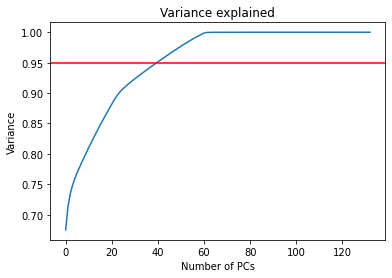

In [ ]:
import pylab as pl
pl.plot(model.explainedVariance.cumsum())
pl.xlabel('Number of PCs')
pl.ylabel('Variance')
pl.title('Variance explained')
pl.axhline(y=0.95, color="red")
pl.show()

In [ ]:
display(df)

10000

pca_features
"Map(vectorType -> dense, length -> 40, values -> List(-0.03624011878692867, -0.5627084444488974, 0.3987038193858378, 0.3590458836193478, 2.5537034722009846, 0.0030169218498992505, -0.5613207061735208, -0.12288052480188086, 0.1946211080666102, -0.6097719219452673, 0.42078894826203406, 0.089229091606452, -0.01471046085125606, -0.04262569225942426, -0.1970264461964333, 0.47627805207338303, 0.570096532161918, -0.40626923238508666, -0.007554526691900458, 0.013674222049651354, 0.07122681316734027, 0.13171290129006508, 0.24156415402424344, -1.6857155167933047, 0.54551104984951, -0.17569762130314, 0.84557559370461, -0.5332355977887863, -1.3142489251768998, -1.3185101136325639, -0.07819500836372209, -0.054616367750452, -0.8389284694127037, -0.9601833566035051, 0.4320741377899785, -1.0403147078100854, -0.21174019708603015, 1.0761352807086442, 0.8280111978202044, 0.3321298759135259))"
"Map(vectorType -> dense, length -> 40, values -> List(-14.273286331581021, -9.037371852578293, 3.903140675516555, 3.962193286648591, -0.11407816337038573, -0.8396886909934703, 2.243205262779337, -5.187111542376769, 1.846948650749746, 2.127557248509998, -2.7069601084550916, -1.233139852867231, -1.4835022288753692, -3.789920730797486, -2.9250700011862176, -1.3844481290042117, 0.07344813366683532, 0.5767998627678033, 0.25340559134924556, -0.6461806830735268, -0.75744137025269, 0.23569693854226603, 3.5968678966222978, -0.8740763434770974, 0.47953306125415224, -2.6741848997216895, 1.2782699862634253, 1.9590393345973893, -0.6304989192796359, 1.3998077137481655, 0.7802930838410553, -1.6135411851081045, -1.2370969515140846, 0.032974373149816494, 0.22890322152902506, 0.7785678771847898, 2.6605690280960186, -0.33721936350255843, -1.9608251725582009, -1.6118365442872877))"
"Map(vectorType -> dense, length -> 40, values -> List(-0.022206393134405606, -0.37274128343999086, 0.284780018120046, 0.2869362236793037, 1.2486425264855714, 0.11866675876598007, -0.12653881626043714, -0.3335580164584159, 0.5500526475901185, -0.6509786729520944, -0.1389027781265716, 0.507009114971662, 0.12499691197489518, -0.2215296954200226, -0.21876114470376776, 0.03423230424959583, 0.17548654056668495, -0.41062890854978357, -0.05706439410693804, 0.33810121814416905, -0.14397606212030595, -0.2222181940669667, 0.20264973581710918, -1.65296350346052, 0.7174932083071458, -0.6501773282422594, 1.6417886686004017, 1.1967041328216415, 0.05961310219695433, -1.2879118867723747, -0.36834249037544, -0.4486352528661461, 0.8253623502781191, -0.8723620538016116, -1.381747230886904, -1.7566380324973325, -0.1650604014716524, 0.02304609502887711, -1.3426920469382568, -0.22020792947242324))"
"Map(vectorType -> dense, length -> 40, values -> List(-5.840267787614739, -6.168166368909314, 6.678903054965327, 3.667000963341309, 0.660774619390811, -1.119889168995904, 0.6697139986950665, -1.3849753766345176, -0.6940410714715042, -0.8389441496535182, -0.1779254032651152, 0.2663743872190508, -1.9508545622106581, 0.44380636655274563, 0.8456473858028761, -0.4603680191637806, -0.8844360816818392, 0.520952763010539, 0.4848499482913856, 1.3835763025556143, 0.5355518593193037, 0.5170410033182566, 1.3915239059419569, -1.513027775240948, 2.2149237714733054, -3.902891865976763, 0.026491980534573425, 0.39724262332172106, -0.4623601176305581, -1.6542780314689771, 0.07409199051404788, -3.075169306923221, -0.23123899359832217, 0.8264953449582698, -1.576320181038646, 0.11168276451857055, 2.192225685593932, -0.7006756075043497, 2.579361946672739, -3.009436968054374))"
"Map(vectorType -> dense, length -> 40, values -> List(-12.026195812446002, -2.439427080767431, -2.4045529287004634, 2.4761236525908004, 3.2196607193019036, 0.4268272738186517, -0.9074142736819952, 1.4983442239702995, 0.7609127203923584, -0.36202164671637527, -1.6301859062114918, 0.9017735832721671, 0.09642074673083012, 2.355806024400519, 2.371659248792931, 0.3639936166745633, -1.4701758085136725, 1.717742991602163, -1.7534971197841858, -3.0436169571564635, -0

In [ ]:
pca = PCA(k=40, inputCol="features", outputCol="pca_features")

stages_kmeans += [pca]


#### K-means

Use K-means clustering

- k: Defines the number of clusters
- seed: This value is used to set the cluster centers. A different value of seed for the same k will result in clusters being defined differently. In order to reproduce similar clusters when re-running the clustering algorithm use the same values of k and seed

#### Elbow Method

In [ ]:
# Calculate cost and plot
cost = np.zeros(20)

for k in [4,6,8,10,12]:
    kmeans = KMeans(k=k, seed=42, distanceMeasure='cosine', initMode='random', maxIter=10,  featuresCol='pca_features')
    model_kmeans = kmeans.fit(df)
    # cost[k] = model.computeCost(transformed_data)
    clusterdData = model_kmeans.transform(df)
    evaluator = ClusteringEvaluator(featuresCol='pca_features', distanceMeasure='cosine')
    cost[k] = evaluator.evaluate(clusterdData)


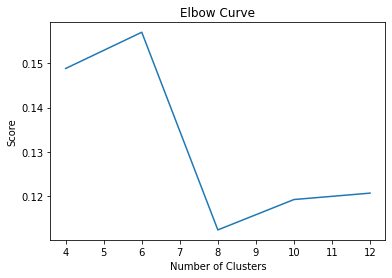

In [ ]:
df_cost = pd.DataFrame([0.14884241, 0.15703417, 0.11234744, 0.11921471, 0.12066472])
df_cost.columns = ["cost"]
new_col = [4,6,8,10,12]
df_cost.insert(0, 'cluster', new_col)

pl.plot(df_cost.cluster, df_cost.cost)
pl.xlabel('Number of Clusters')
pl.ylabel('Score')
pl.title('Elbow Curve')
pl.show()

In [ ]:
kmeans = KMeans(k=8, seed=42)

stages_kmeans += [kmeans]


#### Pipeline execution

In [ ]:
for stage in stages_kmeans:
    print(stage)

PCA_3b46fb26508e
KMeans_d98d84f48d68


In [ ]:
pipeline_kmeans.setStages(stages_kmeans)
pipeline_kmeans_model = pipeline_kmeans.fit(df)

df = pipeline_kmeans_model.transform(df)


In [ ]:
display(df)

title,authors,doc_type,n_citation,year,fos_general,fos_specific,abstract,title_custom_filtered,abstract_custom_filtered,doc_type_int,fos_general_int,fos_specific_int,keywords_int_padded,abstract_w2v,title_w2v,title_TF_IDF,abstract_TF_IDF,features,pca_features,prediction
A solution to the problem of touching and broken characters,"List(List(Jairo Rocha, NA), List(Theo Pavlidis, NA))",conference,17,1993,natural sciences,computer sciences,NA,"List(solution, problem, touching, broken, characters)",List(na),2.0,1.0,1.0,"Map(vectorType -> dense, length -> 20, values -> List(756.0, 207.0, 28.0, 5.0, 561.0, 126.0, 75.0, 505.0, 1879.0, 178.0, 26.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 50, values -> List(-0.0073419855907559395, 0.007256508804857731, -0.0208419319242239, -0.027882566675543785, 0.010541669093072414, -0.0065555088222026825, 0.001488366862758994, 0.015608412213623524, -0.012550009414553642, 0.010789105668663979, 0.03809607774019241, -0.017950356006622314, 0.016467386856675148, -0.017404304817318916, 0.009535225108265877, -0.01805417239665985, 0.0013722043950110674, 0.006793460343033075, 0.005574692972004414, 0.02498568594455719, -0.00905556045472622, 0.0022760143037885427, 0.014954088255763054, -0.009819597005844116, 0.023197537288069725, 0.004514799453318119, -0.003967599477618933, -0.018263598904013634, 0.011829722672700882, 0.006955246906727552, 0.003989462740719318, 0.031273532658815384, -0.004630511626601219, -0.01377151720225811, -0.016878314316272736, -0.025570668280124664, -0.009766603820025921, 0.01765405386686325, 0.005671955179423094, 0.004866422154009342, -8.663256885483861E-4, 0.0014833814930170774, 0.004538780078291893, 0.013965882360935211, 8.973590447567403E-4, 0.001717448583804071, 0.016798952594399452, 0.004868552088737488, 0.04531269520521164, 0.005430437158793211))","Map(vectorType -> dense, length -> 20, values -> List(0.0037469356320798397, -0.0038719347212463617, 1.2076254934072495E-4, -3.2472354359924793E-4, -0.0024824358522892, -0.0015336859971284867, 0.005508851073682309, -0.0017519784159958363, 0.001211290340870619, 0.0010561618953943252, 0.0049745159223675735, 7.146459072828293E-4, 8.897820487618447E-4, -0.004853298515081406, 0.0012556550791487098, -8.182684890925885E-4, -0.0012655491009354591, -0.0017479822039604188, -5.138838663697243E-4, 0.00703075248748064))","Map(vectorType -> sparse, length -> 20, indices -> List(8, 10, 15, 17, 18), values -> List(1.9798772135672238, 1.9140270982025958, 2.0033215107687603, 2.1021962272449755, 2.2229501199755255))","Map(vectorType -> sparse, length -> 20, indices -> List(10), values -> List(0.05392280169784003))","Map(vectorType -> dense, length -> 133, values -> List(1.8725642602034005, 1.9588899779068705, 0.6520068000220103, 0.05879601211981157, 0.017401394621979573, 0.002414315329461139, 4.3544904080695354E-4, 0.05033371289123516, 0.011821666446713315, 0.007232437325445416, 0.04879665516385317, 0.18726583609977193, 0.017880936664162957, 0.0029260276465964273, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0037469356320798397, -0.0038719347212463617, 1.2076254934072495E-4, -3.2472354359924793E-4, -0.0024824358522892, -0.0015336859971284867, 0.005508851073682309, -0.0017519784159958363, 0.001211290340870619, 0.0010561618953943252, 0.0049745159223675735, 7.146459072828293E-4, 8.897820487618447E-4, -0.004853298515081406, 0.0012556550791487098, -8.182684890925885E-4, -0.0012655491009354591, -0.0017479822039604188, -5.138838663697243E-4, 0.00703075248748064, -0.0073419855907559395, 0.007256508804857731, -0.0208419319242239, -0.027882566675543785, 0.010541669093072414, -0.0065555088222026825, 0.001488366862758994, 0.015608412213623524, -0.012550009414553642, 0.010789105668663979, 0.03809607774019241, -0.017950356006622314, 0.016467386856675148, -0.017404304817318916, 0.009535225108265877, -0.01805417239665985, 0.0013722043950110674, 0.006793460343033075, 0.005574692972004414, 0.02498568594455719, -0.00905556045472622

In [ ]:
evaluator = ClusteringEvaluator()
silhouette = evaluator.evaluate(df)
print('Silhouette with squared euclidean distance = ', silhouette)

Silhouette with squared euclidean distance =  0.4877864771138339


### Search Engine

In [ ]:
novel_sample = spark.createDataFrame(novel_sample)


In [ ]:
display(novel_sample)

id,title,authors,doc_type,n_citation,issn,isbn,doi,volume,year,venue,lang,fos_general,fos_specific,keywords,abstract
5fc9a8c59e795eb6c4d312cf,Development of Fractional Order Modeling of Voltage Source Converters,"List(List(Monika Sharma, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Bharat Singh Rajpurohit, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Samar Agnihotri, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Akshay Kumar Rathore, ncordia Univ, Dept Elect & Comp Engn, Montreal, PQ H3G 1M8, Canada))",journal,1,2169-3536,NA,10.1109/ACCESS.2020.3010068,NA,2020,"List(NA, NA, IEEE ACCESS)",en,engineering and technology,"electrical, electronic and information engineering","List(capacitors, fractional calculus, inductors, state-space methods, voltage-source converters, dstatcom, fractional calculus, real-time simulator, small-signal analysis, voltage source converter)","This paper proposes a mathematical fractional order modelling of Voltage Source Converters (VSC). Fractional behaviour helps to model and describe a real object more accurately than the integer order model. State-space equations of VSC is obtained using fractional calculus in d-q domain. The Caputo derivative method is employed to eliminate complex definitions of fractional calculus and to get approximate solution with optimal design of parameters. A detailed analysis is performed on developed mathematical fractional order model of VSC including small-signal analysis and DC analysis. The stability and time-domain transient analysis is carried out to validate the fractional order VSC for its application as Distribution STATtic COMpensator (DSTATCOM) in power distribution system, using real-time simulator. Fractional-order capacitor and inductor are designed and modelled for verification of fractional order VSC through simulations. The real-time simulation results verify the effectiveness of proposed model. It shows that fractional order model can describe the operating characteristics of VSC more accurately. The comparative performance analysis demonstrates superior transient response in case of fractional order devices as compared to integer order"
5fdc306e9e795e20130c4129,Australian ‘gayborhoods’ and ‘lesborhoods’: a new method for estimating the number and prevalence of adult gay men and lesbian women living in each Australian postcode,"List(List(Denton Callander, Spatial Epidemiology Lab, School of Medicine, Columbia University, New York, NY, USA; The Kirby Institute for Infection and Immunity in Society, University of New South Wales, Sydney, Australia), List(Julie Mooney-Somers, Sydney Medical School, University of Sydney, Sydney, Australia), List(Phillip Keen, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Rebecca Guy, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Tim Duck, w South Wales Ministry of Health, Sydney, Australia), List(Benjamin R. Bavinton, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Andrew E. Grulich, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia), List(Martin Holt, ntre for Social Research in Health, University of New South Wales, Sydney, Australia), List(Garrett Prestage, The Kirby Institute for Infection and Immunity in Society, University of New South Wales , Sydney, Australia))",journal,4,NA,NA,10.1080/13658816.2019.1709973,NA,2020,"List(NA, NA, Int. J. Geogr. Inf. Sci)",en,social sciences,sociology,"List(lesbian, demography, geography)","Gay men and lesbian women often demonstrate unique settlement patterns, forming what have been referred to as ‘gayborhoods’. This study sought to provide the first postcode-level estimates of p

#### Pre-processing + Feature Engineering + Clustering

In [ ]:
# pre-processing
novel_sample = preprocessing_data(novel_sample)
novel_sample = pipeline_preprocessing_model.transform(novel_sample)

novel_sample = (novel_sample
    .drop('id', 'issn', 'isbn', 'doi', 'volume', 'venue', 'lang')
)

# feature engineering
novel_sample = pipeline_feature_eng_model.transform(novel_sample)

novel_sample = (novel_sample
    .drop('title_rawTF', 'abstract_rawTF', 'unscaled_features', 'scaled_features', 'abstract_tokenized', 'title_tokenized', 'abstract_filtered', 'title_filtered')
)

# Kmeans clustering
novel_sample = pipeline_kmeans_model.transform(novel_sample)


In [ ]:
display(novel_sample)

title,authors,doc_type,n_citation,year,fos_general,fos_specific,abstract,title_custom_filtered,abstract_custom_filtered,doc_type_int,fos_general_int,fos_specific_int,keywords_int_padded,abstract_w2v,title_w2v,title_TF_IDF,abstract_TF_IDF,features,pca_features,prediction
Development of Fractional Order Modeling of Voltage Source Converters,"List(List(Monika Sharma, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Bharat Singh Rajpurohit, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Samar Agnihotri, Indian Inst Technol Mandi, Sch Comp & Elect Engn, Mandi 175005, Himachal Prades, India), List(Akshay Kumar Rathore, ncordia Univ, Dept Elect & Comp Engn, Montreal, PQ H3G 1M8, Canada))",journal,1,2020,engineering and technology,"electrical, electronic and information engineering",This paper proposes a mathematical fractional order modelling of Voltage Source Converters VSC Fractional behaviour helps to model and describe a real object more accurately than the integer order model State space equations of VSC is obtained using fractional calculus in d q domain The Caputo derivative method is employed to eliminate complex definitions of fractional calculus and to get approximate solution with optimal design of parameters A detailed analysis is performed on developed mathematical fractional order model of VSC including small signal analysis and DC analysis The stability and time domain transient analysis is carried out to validate the fractional order VSC for its application as Distribution STATtic COMpensator DSTATCOM in power distribution system using real time simulator Fractional order capacitor and inductor are designed and modelled for verification of fractional order VSC through simulations The real time simulation results verify the effectiveness of proposed model It shows that fractional order model can describe the operating characteristics of VSC more accurately The comparative performance analysis demonstrates superior transient response in case of fractional order devices as compared to integer order,"List(development, fractional, order, modeling, voltage, source, converters)","List(paper, proposes, mathematical, fractional, order, modelling, voltage, source, converters, vsc, fractional, behaviour, helps, model, describe, real, object, accurately, integer, order, model, state, space, equations, vsc, obtained, fractional, calculus, d, q, domain, caputo, derivative, method, employed, eliminate, complex, definitions, fractional, calculus, get, approximate, solution, optimal, design, parameters, detailed, analysis, performed, developed, mathematical, fractional, order, model, vsc, including, small, signal, analysis, dc, analysis, stability, time, domain, transient, analysis, carried, validate, fractional, order, vsc, application, distribution, stattic, compensator, dstatcom, power, distribution, system, real, time, simulator, fractional, order, capacitor, inductor, designed, modelled, verification, fractional, order, vsc, simulations, real, time, simulation, results, verify, effectiveness, proposed, model, shows, fractional, order, model, describe, operating, characteristics, vsc, accurately, comparative, performance, analysis, demonstrates, superior, transient, response, case, fractional, order, devices, compared, integer, order)",1.0,2.0,3.0,"Map(vectorType -> dense, length -> 20, values -> List(12.0, 3.0, 37.0, 64.0, 71.0, 23.0, 3.0, 55.0, 62.0, 70.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 50, values -> List(0.04897931916451442, -0.04942540544594052, -0.010936076837805881, 0.026004618625231686, 0.03120006941213843, -0.00534943377363473, -0.005882646052698199, 0.11180777280230447, -0.0298074542478125, -0.010149328075767112, -0.037679218208312146, -0.007799683953635395, 0.03898572502446534, 0.03456459602485636, -0.01839699637756923, -0.027790991445785507, -0.014719061589153903, -0.015681

#### Cosine similarity

\# todo

- define correct UDF for cosine similarity calculation between a given vector and all other vectors in the main data frame
- run a transformation that subsets all elements of the predicted k cluster for the neew sample and calculates cosine similarities
- sort and thet the tp 10 closest elements

In [ ]:
pipeline_feature_eng_model.stages[1].findSynonyms("graph", 5).show()


+------------+------------------+
|        word|        similarity|
+------------+------------------+
|        grid|0.7312535047531128|
|  everywhere|0.6633735299110413|
|      curves|0.6406309604644775|
|       forum|0.6397682428359985|
|technologies| 0.634766161441803|
+------------+------------------+



In [ ]:
def cos_sim(vinput, vx): 
    return np.dot(vinput, vx) / np.sqrt(np.dot(vinput, vinput)) / np.sqrt(np.dot(vx, vx)) 

cos_sim_udf = F.udf(lambda vx:cos_sim(vinput,vx))   

In [ ]:
display(df
     # removes html tags
    .withColumn("cos_sim", cossim_udf(vector , F.col("title"))) 
)


### Purge delta tables

In [ ]:
%sh

ls -lsh /mnt

total 32K
 24K -rw-r--r-- 1 root root  21K May 28 08:58 dictionary_fos.txt
4.0K drwxr-xr-x 2 root root 4.0K May 28 07:37 driver-daemon
4.0K drwxr-xr-x 2 root root 4.0K May 28 07:37 readonly


In [ ]:
%fs

ls /user/hive/warehouse/

path,name,size,modificationTime
dbfs:/user/hive/warehouse/_committed_140098711880695482,_committed_140098711880695482,222,1653503414000
dbfs:/user/hive/warehouse/_committed_1823990921207546219,_committed_1823990921207546219,223,1653503026000
dbfs:/user/hive/warehouse/_committed_2618448479493195264,_committed_2618448479493195264,222,1653500590000
dbfs:/user/hive/warehouse/_committed_276202957567659857,_committed_276202957567659857,222,1653500378000
dbfs:/user/hive/warehouse/_committed_4560362115751107150,_committed_4560362115751107150,223,1653503230000
dbfs:/user/hive/warehouse/_committed_4781748796520471704,_committed_4781748796520471704,222,1653502480000
dbfs:/user/hive/warehouse/_committed_4945852690702862520,_committed_4945852690702862520,223,1653500814000
dbfs:/user/hive/warehouse/_committed_5454470160437766372,_committed_5454470160437766372,223,1653501036000
dbfs:/user/hive/warehouse/_committed_641909369749824286,_committed_641909369749824286,222,1653502199000
dbfs:/user/hive/warehouse/_committed_7206901163515394298,_committed_7206901163515394298,223,1653502861000
